In [ ]:
!pip install hvplot
import holoviews as hv
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import hvplot.pandas


     |████████████████████████████████| 3.1MB 9.0MB/s 


In [ ]:
data = pd.read_csv('https://tinyurl.com/ChrisCoDV/001139282/DailyCustomers.csv', index_col=0)
data.index = pd.to_datetime(data.index)

In [ ]:
print(data.head())
print(data.describe())

            VSM  AEI  CNQ  ATT  OMV  TAP  ...  EFN  NGB  BZM  TSE  WMB  SMM
Date                                      ...                              
2019-01-01   72    0   63   67  369   85  ...   93    0   72   67   91  895
2019-01-02   58    0   73   46  361   92  ...  100    0   73   95   91  793
2019-01-03   78    0   61   62  334   66  ...   71    0   77  100   86  929
2019-01-04   58    0   72   51  322   93  ...  118    0   80   98   90  831
2019-01-05   73    0   64   77  279   67  ...  101    0   69   84   84  862

[5 rows x 40 columns]
              VSM         AEI         CNQ  ...         TSE         WMB          SMM
count  365.000000  365.000000  365.000000  ...  365.000000  365.000000   365.000000
mean    68.473973   38.901370   65.002740  ...   89.295890   88.219178   880.934247
std      9.469587   53.901937    4.188222  ...    9.859179    5.186750   108.164055
min     45.000000    0.000000   53.000000  ...   56.000000   72.000000   596.000000
25%     62.000000    0.00

In [ ]:
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)
print(data.head())

             RAH   SGA  SMM  QSN  RGS  PAA  ...  AEI  ZMS  NGB  YYO  ZSD  MAJ
Date                                        ...                              
2019-01-01  1107  1013  895  974  574  602  ...    0   59    0    0    0    0
2019-01-02  1036   969  793  764  444  562  ...    0   70    0    0    0    0
2019-01-03   954   890  929  773  540  481  ...    0   54    0    0    0    0
2019-01-04   892   814  831  720  331  405  ...    0   47    0    0    0    0
2019-01-05   866   820  862  681  518  347  ...    0   57    0    0    0    0

[5 rows x 40 columns]


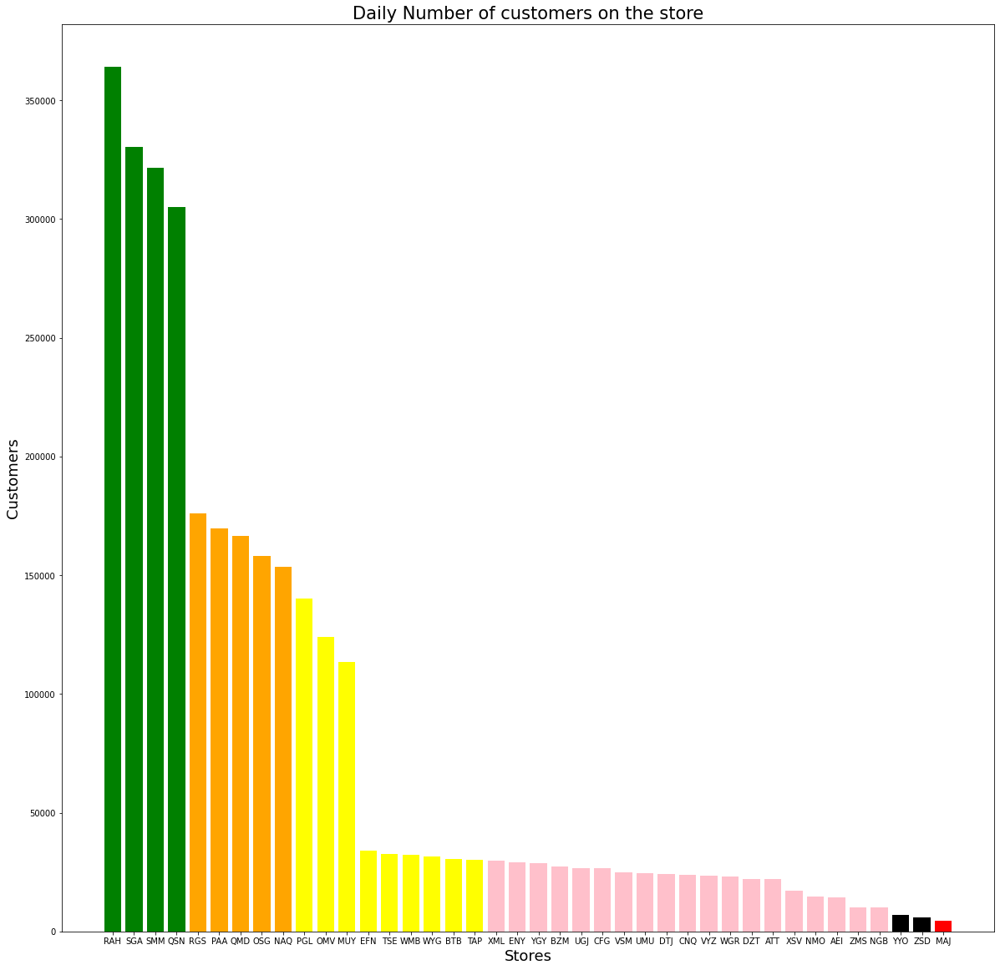

In [ ]:
#Using colors
colours = []
for name in data.columns:
    total_Customers = data[name].sum()
    if total_Customers > 300000:
        colour = 'green'
    elif total_Customers > 150000:
        colour = 'orange'
    elif total_Customers > 30000:
        colour = 'Yellow'
    elif total_Customers > 10000:
        colour = 'Pink'
    elif total_Customers > 5000:
          colour = 'Black'
    else:
        colour = 'red'
    colours.append(colour)
plt.figure(figsize=(20, 20))
x_pos = np.arange(len(data.columns))
plt.bar(x_pos, data.sum(), align='center', color=colours)
plt.xticks(x_pos, data.columns)
plt.xlabel('Stores', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('Daily Number of customers on the store', fontsize=21)
plt.show()

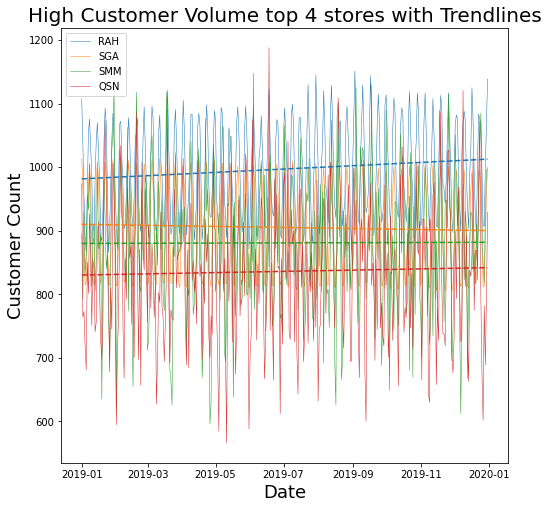

In [ ]:
selected = ['RAH','SGA','SMM','QSN']

plt.figure(figsize=(8, 8))
plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
for name in selected:
    x = np.arange(len(data[name]))
    z = np.polyfit(x, data[name], 1)
    trend = np.poly1d(z)
    plt.plot(data.index, trend(x), linestyle='--')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customer Count', fontsize=18)
plt.title('High Customer Volume top 4 stores'
    + ' with Trendlines', fontsize=20)
plt.legend(selected, loc=2)
plt.show()

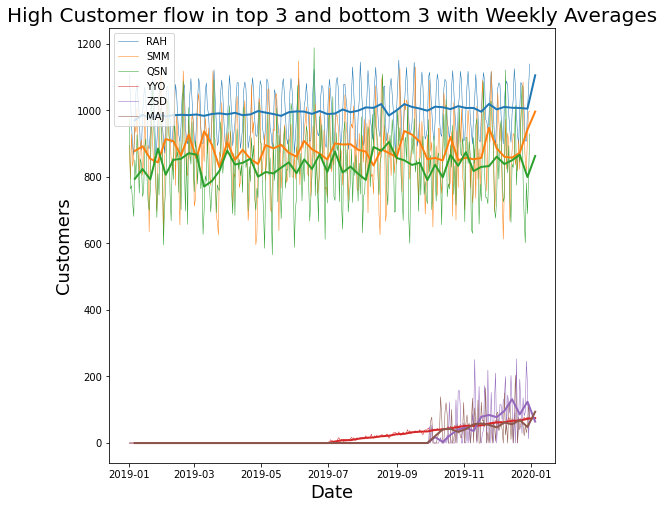

In [ ]:
sample_rate = 'W'
averaged_data = data.resample(sample_rate).mean()

selected = ['RAH','SMM','QSN', 'YYO','ZSD', 'MAJ']

plt.figure(figsize=(8, 8))
plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Customers', fontsize=18)
plt.title('High Customer flow in top 3 and bottom 3 with Weekly Averages',
    fontsize=20)
plt.legend(data[selected], loc=2)
plt.show()

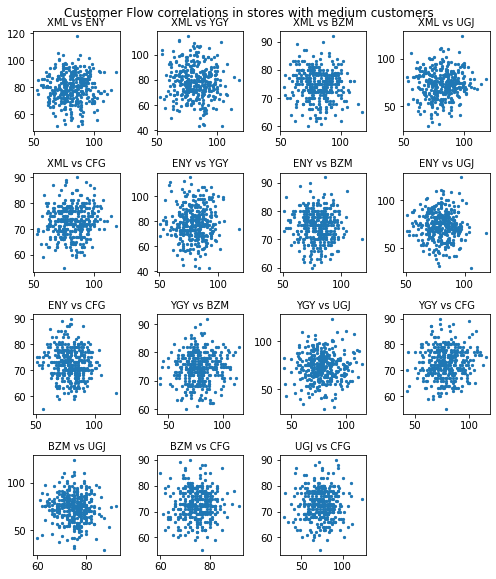

In [ ]:
selected = ['XML','ENY','YGY','BZM','UGJ','CFG' ]

counter = 1
fig = plt.figure(figsize=(7,8))
fig.suptitle('Customer Flow correlations in stores with medium customersCustomer Flow correlations in stores with medium customers',
    fontsize=12, position=(0.5, 1.0))
for i, name_i in enumerate(selected):
    for j in range(i + 1, len(selected)):
        name_j = selected[j]
        sub = fig.add_subplot(4, 4, counter)
        sub.set_title(name_i + ' vs ' + name_j,

            fontsize=10)
        sub.scatter(data[name_i], data[name_j], s=5)
        counter += 1
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.tight_layout()
plt.show()


31 bins


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
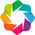

:NdOverlay   [Element]
   :Histogram   [QSN]   (QSN_count)

In [ ]:
#Interactive
selected = ['RAH','SGA','SMM','QSN']

x_min = 250
x_max = 550
bin_width = 10
n_bins = int((bin_width + x_max - x_min) / bin_width)
print(str(n_bins) + ' bins')
bins = [(x_min + x * (bin_width + x_max - x_min) / n_bins) for x in range(int(n_bins))]

plot = data[selected].hvplot.hist(
    frame_height=500, frame_width=500,
    xlabel='Total customer visit', ylabel='Frequency',
    title='High Volume customer flow',
    alpha=0.5, muted_alpha=0, muted_fill_alpha=0, muted_line_alpha=0,
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset'],
    bins=bins
)
hv.extension('bokeh')
plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
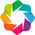

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [ ]:
selected = ['RAH','SGA','SMM','QSN']

plot = data[selected].hvplot.line(
    frame_height=500, frame_width=500,
    xlabel='Date', ylabel=' Customer flow  per day',
    title='High Volume customer flow'
)
hv.extension('bokeh')
plot

In [ ]:
storemarketing = pd.read_csv('https://tinyurl.com/ChrisCoDV/001139282/StoreMarketing.csv', index_col=0)
storeoverhead = pd.read_csv('https://tinyurl.com/ChrisCoDV/001139282/StoreOverheads.csv', index_col=0)
storesize = pd.read_csv('https://tinyurl.com/ChrisCoDV/001139282/StoreSize.csv', index_col=0)
storestaff = pd.read_csv('https://tinyurl.com/ChrisCoDV/001139282/StoreStaff.csv', index_col=0)

In [ ]:
summary_data = pd.DataFrame(index=data.columns)
summary_data['Customers'] = data.sum().values
summary_data['StoreMarketing'] = storemarketing.values
summary_data['StoreOverheads'] = storeoverhead.values
summary_data['StoreSizes'] = storesize.values
summary_data['StoreStaffs'] = storestaff.values



In [ ]:
print(summary_data.head())
print(summary_data.tail())
print(summary_data.describe())

     Customers  StoreMarketing  StoreOverheads  StoreSizes  StoreStaffs
RAH     363946            3000           78000         375            4
SGA     330384            2000           94000         204            2
SMM     321541            3000           27000         406            4
QSN     305175            3000           90000         124            2
RGS     175904           14000           11000        1090            8
     Customers  StoreMarketing  StoreOverheads  StoreSizes  StoreStaffs
ZMS      10282            2000           60000         112            2
NGB      10248            3000           68000         416            5
YYO       7035            3000           83000         269            2
ZSD       6066            4000           73000         245            3
MAJ       4612           34000           47000        4189           22
           Customers  StoreMarketing  StoreOverheads  StoreSizes  StoreStaffs
count      40.000000       40.000000       40.000000    40

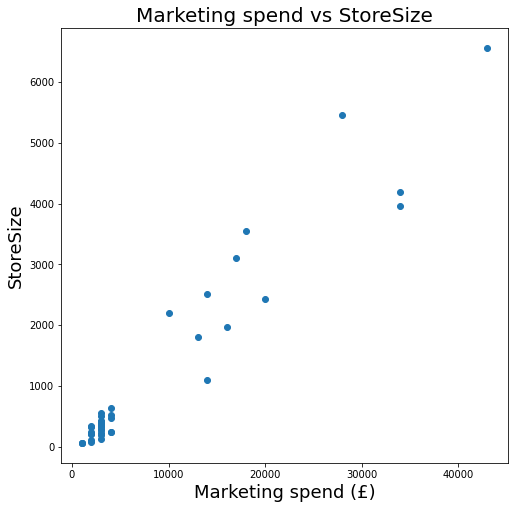

In [ ]:
plt.figure(figsize=(8, 8))
plt.scatter(summary_data['StoreMarketing'], summary_data['StoreSizes'])
plt.title('Marketing spend vs StoreSize', fontsize=20)
plt.xlabel('Marketing spend (£)', fontsize=18)
plt.ylabel('StoreSize', fontsize=18)
plt.show()

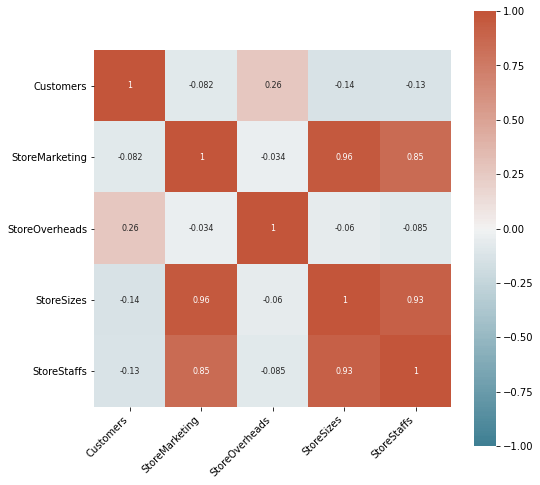

In [ ]:
plt.figure(figsize=(8, 8))
corr = summary_data.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(220, 20, n=200),
    square=True, annot=True, annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45,
    horizontalalignment='right')
plt.show()


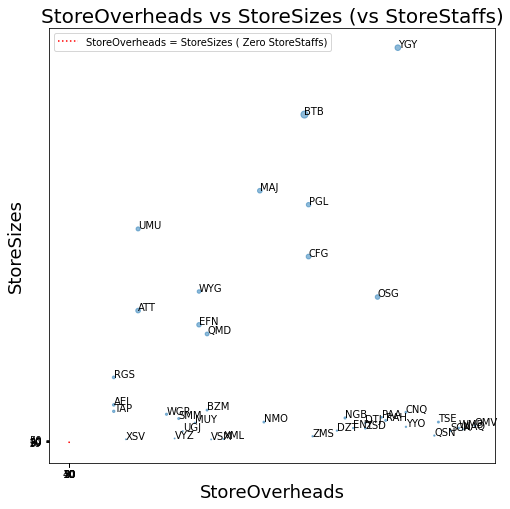

In [ ]:
summary_data['BubbleSize'] = summary_data['StoreStaffs']
plt.figure(figsize=(8, 8))
plt.scatter(summary_data['StoreOverheads'], summary_data['StoreSizes'], s=summary_data['BubbleSize'], alpha=0.5)
plt.xticks([10, 20, 30, 40, 50])
plt.yticks([10, 20, 30, 40, 50])
plt.title('StoreOverheads vs StoreSizes (vs StoreStaffs)', fontsize=20)
plt.xlabel('StoreOverheads', fontsize=18)
plt.ylabel('StoreSizes', fontsize=18)
for i, name in enumerate(summary_data.index):
    plt.annotate(name, (summary_data['StoreOverheads'][i], summary_data['StoreSizes'][i]))
plt.plot([0, 50], [0, 50], linestyle=':', color='r', label='StoreOverheads = StoreSizes ( Zero StoreStaffs)')
plt.legend(loc=2)
plt.show()


     Customers  StoreMarketing  ...  StoreStaffs  BubbleSize
RAH   1.000000        0.069767  ...     0.078431    0.078431
SGA   0.907783        0.046512  ...     0.039216    0.039216
SMM   0.883485        0.069767  ...     0.078431    0.078431
QSN   0.838517        0.069767  ...     0.039216    0.039216
RGS   0.483324        0.325581  ...     0.156863    0.156863

[5 rows x 6 columns]


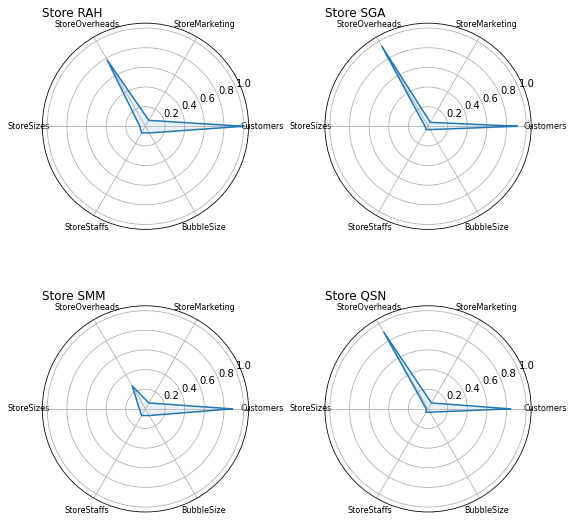

In [ ]:
#Radarplot Subplot
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['RAH','SGA','SMM','QSN']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(8, 8))
counter = 1
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(2, 2, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title('Store ' + name, fontsize=12, loc='left')
    counter += 1
plt.tight_layout()
plt.show()

     Customers  StoreMarketing  ...  StoreStaffs  BubbleSize
RAH   1.000000        0.069767  ...     0.078431    0.078431
SGA   0.907783        0.046512  ...     0.039216    0.039216
SMM   0.883485        0.069767  ...     0.078431    0.078431
QSN   0.838517        0.069767  ...     0.039216    0.039216
RGS   0.483324        0.325581  ...     0.156863    0.156863

[5 rows x 6 columns]


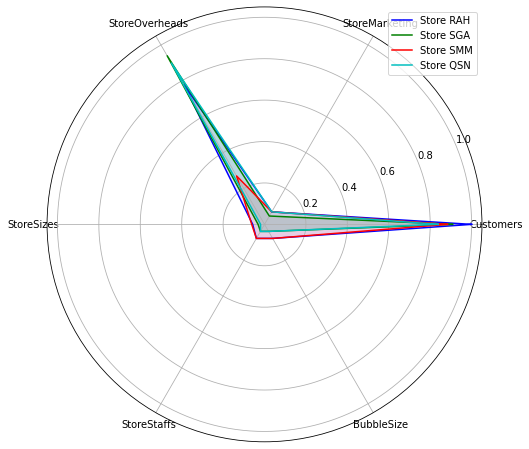

In [ ]:
#Radar plot Overlaid
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['RAH','SGA','SMM','QSN']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(8, 8))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)], label='Store ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=1)
plt.show()